In [15]:
cd d:/Py/envs/seg/Lib/site-packages/ultralytics/1822a

d:\Py\envs\seg\Lib\site-packages\ultralytics\1822a


In [1]:
# Disable warnings in the notebook to maintain clean output cells
import warnings
warnings.filterwarnings('ignore')

# Import necessary libraries
import os
import shutil
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import random
import cv2
import yaml
from PIL import Image
from collections import deque
from ultralytics import YOLO
from IPython.display import Video

In [3]:
from ultralytics import YOLO
if __name__ == '__main__':
    # 加载模型
    model = YOLO("e:\ultralytics\yolov8n-seg.pt") 
    # model = YOLO("ultralytics/cfg/models/v8/SA-SS-seg.yaml")  # 从头开始构建新模型

SyntaxError: (unicode error) 'unicodeescape' codec can't decode bytes in position 2-3: truncated \uXXXX escape (1396992748.py, line 4)

In [3]:
sns.set_theme(rc={'axes.facecolor': '#ffe4de'}, style='darkgrid')

In [7]:
# Define the dataset_path
dataset_path = 'e:/1822a'
# Set the path to the YAML file
yaml_file_path = os.path.join(dataset_path, 'data.yaml')
print(yaml_file_path)

# Load and print the contents of the YAML file
with open(yaml_file_path, 'r') as file:
    yaml_content = yaml.load(file, Loader=yaml.FullLoader)
    print(yaml.dump(yaml_content, default_flow_style=False))

e:/1822a\data.yaml
names:
- curb
nc: 1
roboflow:
  license: CC BY 4.0
  project: xiaoshuai
  url: https://universe.roboflow.com/yolov5-joo2t/xiaoshuai/dataset/7
  version: 7
  workspace: yolov5-joo2t
test: ../test/images
train: ../train/images
val: ../valid/images



In [6]:
# Set paths for training and validation image sets
train_images_path = os.path.join(dataset_path, 'train', 'images')
valid_images_path = os.path.join(dataset_path, 'valid', 'images')
# test_images_path = os.path.join(dataset_path, 'test', 'images')
# Initialize counters for the number of images
num_train_images = 0
num_valid_images = 0
# num_test_images = 0

# Initialize sets to hold the unique sizes of images
train_image_sizes = set()
valid_image_sizes = set()
# test_image_sizes = set()

In [7]:
# Check train images sizes and count
for filename in os.listdir(train_images_path):
    if filename.endswith('.jpg'):
        num_train_images += 1
        image_path = os.path.join(train_images_path, filename)
        with Image.open(image_path) as img:
            train_image_sizes.add(img.size)

# Check validation images sizes and count
for filename in os.listdir(valid_images_path):
    if filename.endswith('.jpg'):
        num_valid_images += 1
        image_path = os.path.join(valid_images_path, filename)
        with Image.open(image_path) as img:
            valid_image_sizes.add(img.size)

In [8]:
# Print the results
print(f"Number of training images: {num_train_images}")
print(f"Number of validation images: {num_valid_images}")

Number of training images: 1260
Number of validation images: 562


In [9]:
if len(train_image_sizes) == 1:
    print(f"All training images have the same size: {train_image_sizes.pop()}")
else:
    print("Training images have varying sizes.")

# Check if all images in validation set have the same size
if len(valid_image_sizes) == 1:
    print(f"All validation images have the same size: {valid_image_sizes.pop()}")
else:
    print("Validation images have varying sizes.")

All training images have the same size: (640, 640)
All validation images have the same size: (640, 640)


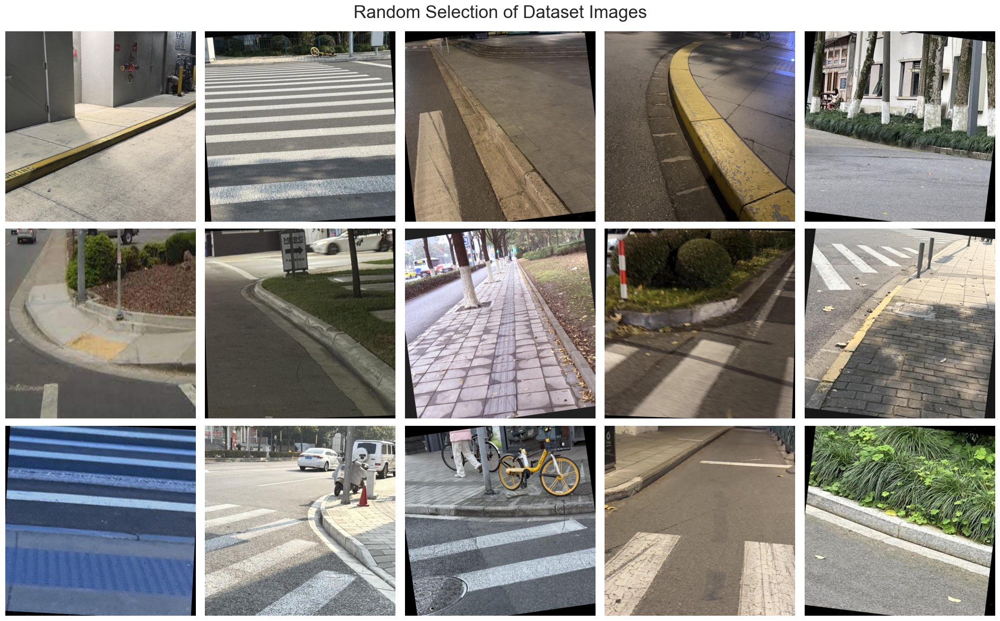

In [10]:
# Set the seed for the random number generator
random.seed(42)

# Create a list of image files
image_files = [f for f in os.listdir(train_images_path) if f.endswith('.jpg')]

# Randomly select 15 images
random_images = random.sample(image_files, 15)

# Create a new figure
plt.figure(figsize=(19, 12))

# Loop through each image and display it in a 3x5 grid
for i, image_file in enumerate(random_images):
    image_path = os.path.join(train_images_path, image_file)
    image = Image.open(image_path)
    plt.subplot(3, 5, i + 1)
    plt.imshow(image)
    plt.axis('off')

# Add a suptitle
plt.suptitle('Random Selection of Dataset Images', fontsize=24)

# Show the plot
plt.tight_layout()
plt.show()

# Deleting unnecessary variable to free up memory
del image_files

In [12]:
# Train the model on our custom dataset
results = model.train(
    data=yaml_file_path,     # Path to the dataset configuration file
    epochs=500,              # Number of epochs to train for
    imgsz=640,               # Size of input images as integer
    patience=50,             # Epochs to wait for no observable improvement for early stopping of training
    batch=4,                # Number of images per batch
    optimizer='SGD',        # Optimizer to use, choices=[SGD, Adam, Adamax, AdamW, NAdam, RAdam, RMSProp, auto]
    #lr0=0.01,              # Initial learning rate
    #lrf=0.0005,                # Final learning rate (lr0 * lrf)
    dropout=0.25,            # Use dropout regularization
    device='cpu',                # Device to run on, i.e. cuda device=0
    seed=42,                  # Random seed for reproducibility
    pretrained='false'
)

New https://pypi.org/project/ultralytics/8.3.51 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.49  Python-3.8.0 torch-2.4.1+cpu CPU (Intel Core(TM) i7-10750H 2.60GHz)
engine\trainer: task=segment, mode=train, model=ultralytics/cfg/models/v8/SA-SS-seg.yaml, data=e:/1822\data.yaml, epochs=500, time=None, patience=50, batch=4, imgsz=640, save=True, save_period=-1, cache=False, device=cpu, workers=8, project=None, name=train4, exist_ok=False, pretrained=false, optimizer=SGD, verbose=True, seed=42, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.25, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=No

train: Scanning E:\1822\train\labels... 1260 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1260/1260 [00:01<00:00, 752.78it/s]


train: New cache created: E:\1822\train\labels.cache


val: Scanning E:\1822\valid\labels... 562 images, 0 backgrounds, 0 corrupt: 100%|██████████| 562/562 [00:00<00:00, 778.73it/s]

val: New cache created: E:\1822\valid\labels.cache


Plotting labels to runs\segment\train4\labels.jpg... 
optimizer: SGD(lr=0.01, momentum=0.937) with parameter groups 97 weight(decay=0.0), 135 weight(decay=0.0005), 134 bias(decay=0.0)
TensorBoard: model graph visualization added 
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to runs\segment\train4
Starting training for 500 epochs...

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      1/500         0G      3.969      9.852      4.789      4.251         10        640:   5%|▌         | 17/315 [03:59<1:10:04, 14.11s/it]


KeyboardInterrupt: 

In [2]:
cd e:/Results_668/SA-SS-DySample-1822-4

e:\Results_668\SA-SS-DySample-1822-4


In [16]:
ls

runs/     train12/  train16/  train2/   train23/  train5/  train9/
train/    train13/  train17/  train20/  train24/  train6/
train10/  train14/  train18/  train21/  train3/   train7/
train11/  train15/  train19/  train22/  train4/   train8/


In [17]:
cp -r train24 /root/autodl-fs

In [4]:
# Define the path to the directory
post_training_files_path = r'E:\Results_668\SA-SS-DySample-1822-4'

# List the files in the directory
!ls {post_training_files_path}

'ls' �����ڲ����ⲿ���Ҳ���ǿ����еĳ���
���������ļ���


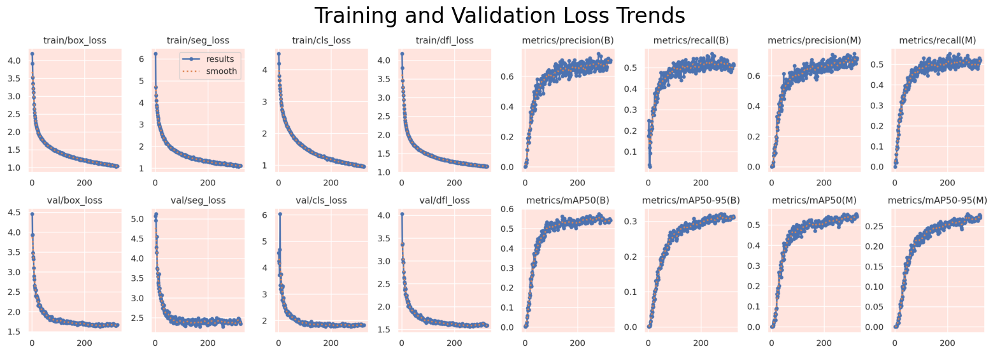

In [5]:
# Create the full file path by joining the directory path with the filename
results_file_path = os.path.join(post_training_files_path, 'results.png')

# Read the image using cv2
image = cv2.imread(results_file_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Display the image using matplotlib
plt.figure(figsize=(20, 8))
plt.imshow(image)
plt.title('Training and Validation Loss Trends', fontsize=24)
plt.axis('off')
plt.show()

In [6]:
# Define a function to plot learning curves for loss values
def plot_learning_curve(df, train_loss_col, val_loss_col, title, ylim_range=[0,2]):
    plt.figure(figsize=(12, 4))
    sns.lineplot(data=df, x='epoch', y=train_loss_col, label='Train Loss', color='blue', linestyle='-', linewidth=2)
    sns.lineplot(data=df, x='epoch', y=val_loss_col, label='Validation Loss', color='#ed2f00', linestyle='--', linewidth=2)
    plt.title(title)
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.ylim(ylim_range)
    plt.legend()
    plt.show()

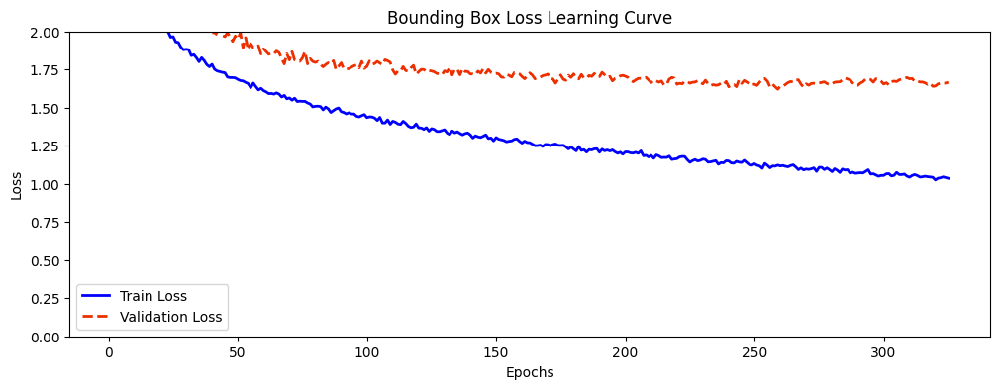

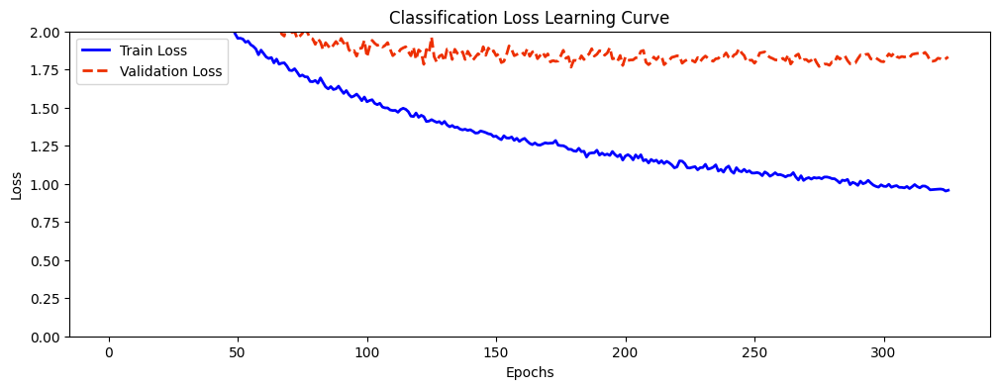

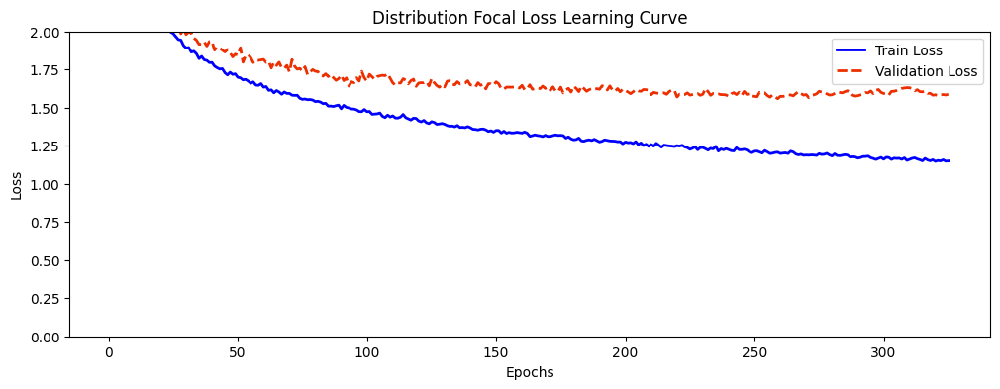

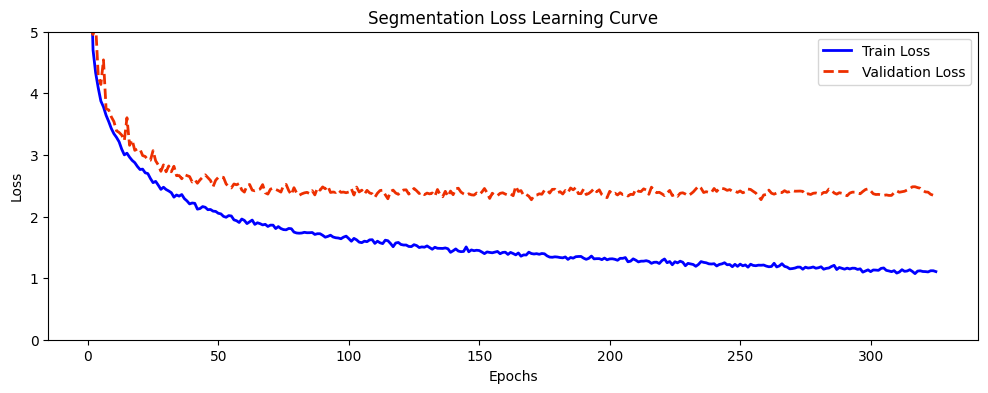

In [7]:
# Create the full file path for 'results.csv' using the directory path and file name
results_csv_path = os.path.join(post_training_files_path, 'results.csv')

# Load the CSV file from the constructed path into a pandas DataFrame
df = pd.read_csv(results_csv_path)

# Remove any leading whitespace from the column names
df.columns = df.columns.str.strip()

# Plot the learning curves for each loss
plot_learning_curve(df, 'train/box_loss', 'val/box_loss', 'Bounding Box Loss Learning Curve')
plot_learning_curve(df, 'train/cls_loss', 'val/cls_loss', 'Classification Loss Learning Curve')
plot_learning_curve(df, 'train/dfl_loss', 'val/dfl_loss', 'Distribution Focal Loss Learning Curve')
plot_learning_curve(df, 'train/seg_loss', 'val/seg_loss', 'Segmentation Loss Learning Curve', ylim_range=[0,5])

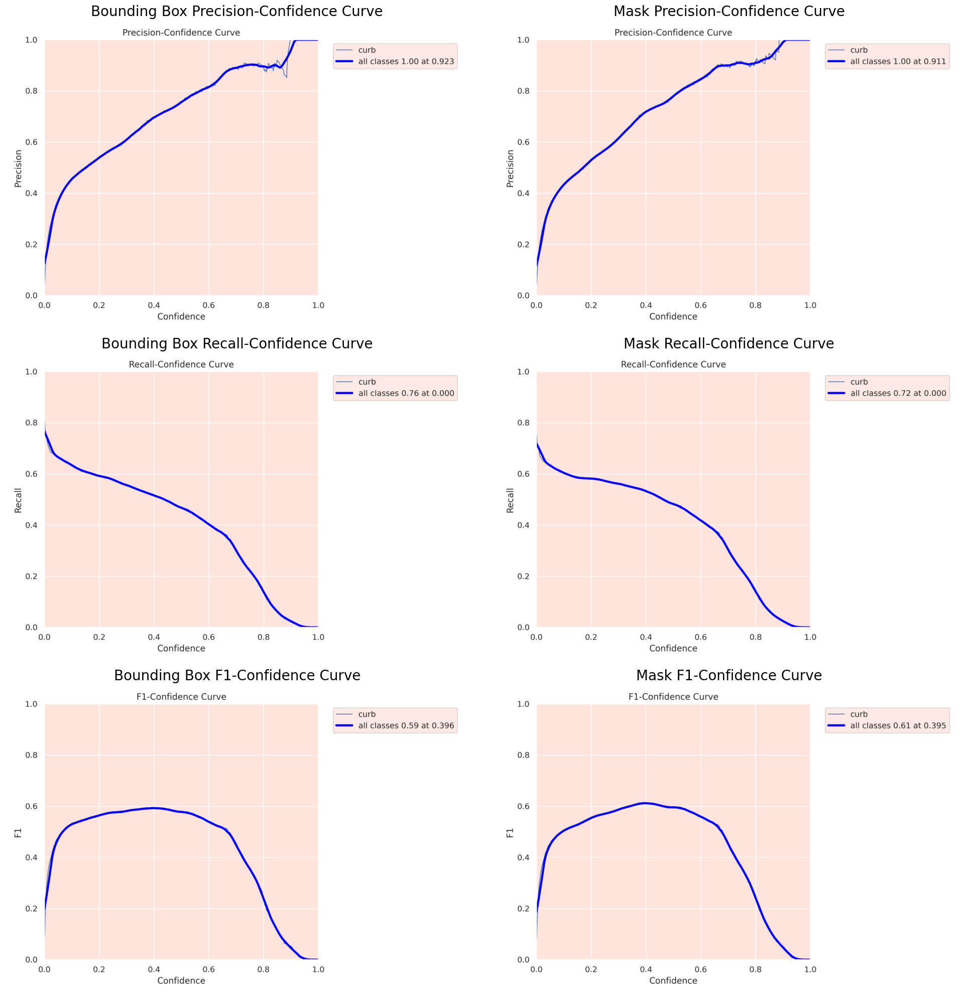

In [8]:
# 评估模型在不同置信水平下的预测性能，使用精度、召回率和F1分数指标对边界框和掩码预测进行评估
# Define the filenames for 'Box' and 'Mask' metrics along with their titles
box_files_titles = {
    'BoxP_curve.png': 'Bounding Box Precision-Confidence Curve',
    'BoxR_curve.png': 'Bounding Box Recall-Confidence Curve',
    'BoxF1_curve.png': 'Bounding Box F1-Confidence Curve'
}
mask_files_titles = {
    'MaskP_curve.png': 'Mask Precision-Confidence Curve',
    'MaskR_curve.png': 'Mask Recall-Confidence Curve',
    'MaskF1_curve.png': 'Mask F1-Confidence Curve'
}

# Create a 3x2 subplot
fig, axs = plt.subplots(3, 2, figsize=(20, 20))

# Function to read and convert image for plotting
def read_and_convert_image(file_path):
    # Read the image using cv2
    image = cv2.imread(file_path)
    # Convert from BGR to RGB
    return cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Plot 'Box' images in the first column with meaningful titles
for i, (filename, title) in enumerate(box_files_titles.items()):
    img_path = os.path.join(post_training_files_path, filename)
    img = read_and_convert_image(img_path)
    axs[i, 0].imshow(img)
    axs[i, 0].set_title(title, fontsize=20)
    axs[i, 0].axis('off')

# Plot 'Mask' images in the second column with meaningful titles
for i, (filename, title) in enumerate(mask_files_titles.items()):
    img_path = os.path.join(post_training_files_path, filename)
    img = read_and_convert_image(img_path)
    axs[i, 1].imshow(img)
    axs[i, 1].set_title(title, fontsize=20)
    axs[i, 1].axis('off')

plt.tight_layout()
plt.show()

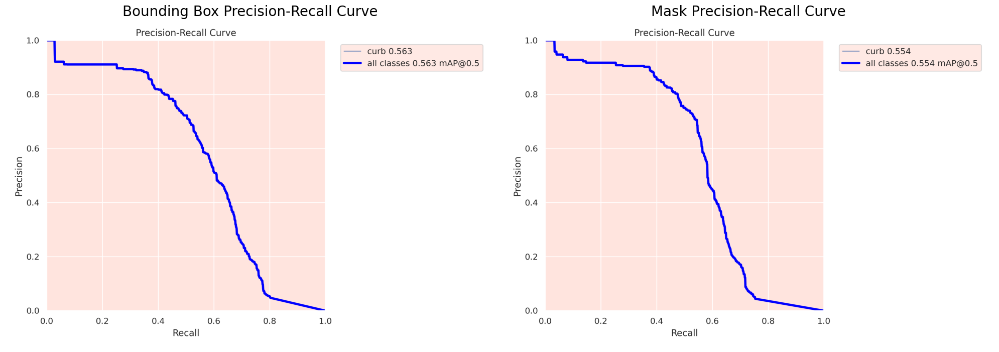

In [9]:
# Precision-Recall Curve Analysis
# Define the filenames for 'Box' and 'Mask' metrics along with their titles
pr_files_titles = {
    'BoxPR_curve.png': 'Bounding Box Precision-Recall Curve',
    'MaskPR_curve.png': 'Mask Precision-Recall Curve'
}

# Create a 1x2 subplot
fig, axs = plt.subplots(1, 2, figsize=(20, 10))

# Plot 'Box' and 'Mask' images in the subplot with meaningful titles
for i, (filename, title) in enumerate(pr_files_titles.items()):
    img_path = os.path.join(post_training_files_path, filename)
    img = read_and_convert_image(img_path)
    axs[i].imshow(img)
    axs[i].set_title(title, fontsize=20)
    axs[i].axis('off')

plt.tight_layout()
plt.show()

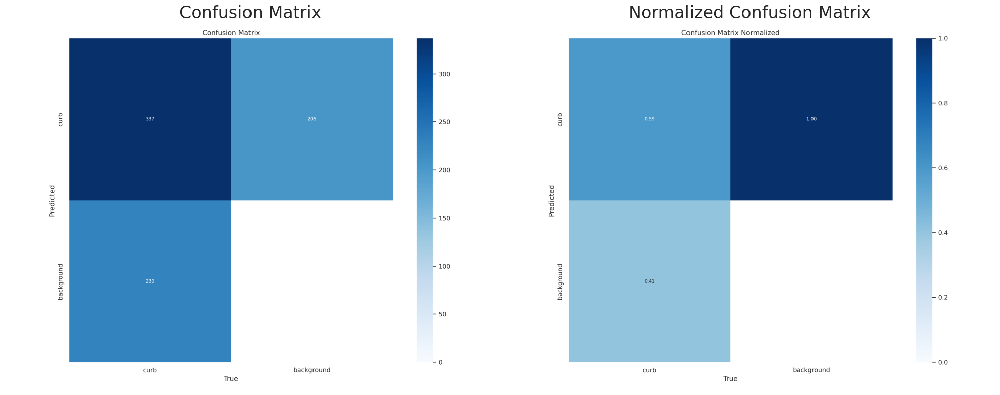

In [24]:
# Confusion Matrix Analysis
# true positive rate真阳性率77%  false negative rate假阴性率23%
# Construct the path to the confusion matrix images
confusion_matrix_path = os.path.join(post_training_files_path, 'confusion_matrix.png')
confusion_matrix_normalized_path = os.path.join(post_training_files_path, 'confusion_matrix_normalized.png')

# Create a 1x2 subplot
fig, axs = plt.subplots(1, 2, figsize=(20, 10))

# Read and convert both images
cm_img = read_and_convert_image(confusion_matrix_path)
cm_norm_img = read_and_convert_image(confusion_matrix_normalized_path)

# Display the images
axs[0].imshow(cm_img)
axs[0].set_title('Confusion Matrix', fontsize=24)
axs[0].axis('off')

axs[1].imshow(cm_norm_img)
axs[1].set_title('Normalized Confusion Matrix', fontsize=24)
axs[1].axis('off')

plt.tight_layout()
plt.show()

In [4]:
import os

In [11]:
# 验证性能指标评估
post_training_files_path=r"E:\Results_668\SA-SS-DySample-1822-4"
# Construct the path to the best model weights file using os.path.join
best_model_path = os.path.join(post_training_files_path, 'weights/best.pt')

# Load the best model weights into the YOLO model
best_model = YOLO(best_model_path)

# Validate the best model using the validation set with default parameters
metrics = best_model.val(split='val')

Ultralytics 8.3.49  Python-3.8.0 torch-2.4.1+cpu CPU (Intel Core(TM) i7-10750H 2.60GHz)
SA-SS-seg summary: 357 layers, 3,977,692 parameters, 0 gradients, 192.0 GFLOPs


FileNotFoundError: '/root/autodl-fs/1822/data.yaml' does not exist

In [27]:
# Convert the dictionary to a pandas DataFrame and use the keys as the index
metrics_df = pd.DataFrame.from_dict(metrics.results_dict, orient='index', columns=['Metric Value'])

# Display the DataFrame
metrics_df.round(3)

,Metric Value
metrics/precision(B),0.690
metrics/recall(B),0.515
metrics/mAP50(B),0.561
metrics/mAP50-95(B),0.319
metrics/precision(M),0.714
metrics/recall(M),0.527
metrics/mAP50(M),0.550
metrics/mAP50-95(M),0.277
fitness,0.647



image 1/1 /root/autodl-fs/1822/valid/images/pic-1021_jpg.rf.37f254282f1b076884f734ebfbbfa13b.jpg: 640x640 5 curbs, 17.8ms
Speed: 1.6ms preprocess, 17.8ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /root/autodl-fs/1822/valid/images/pic-1080_jpg.rf.26adb74beefed0001ef532d96a617d85.jpg: 640x640 1 curb, 15.9ms
Speed: 1.5ms preprocess, 15.9ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /root/autodl-fs/1822/valid/images/pic-1107_jpg.rf.838fc2de94a259d74eac624c3802a088.jpg: 640x640 1 curb, 15.4ms
Speed: 1.4ms preprocess, 15.4ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /root/autodl-fs/1822/valid/images/pic-1133_jpg.rf.2703501740da4428d01d530fdcbadef7.jpg: 640x640 3 curbs, 16.2ms
Speed: 1.3ms preprocess, 16.2ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /root/autodl-fs/1822/valid/images/pic-1160_jpg.rf.0d86fd6cdf33a99bc312fb184a484601.jpg: 640x640 2 curbs, 15.3ms

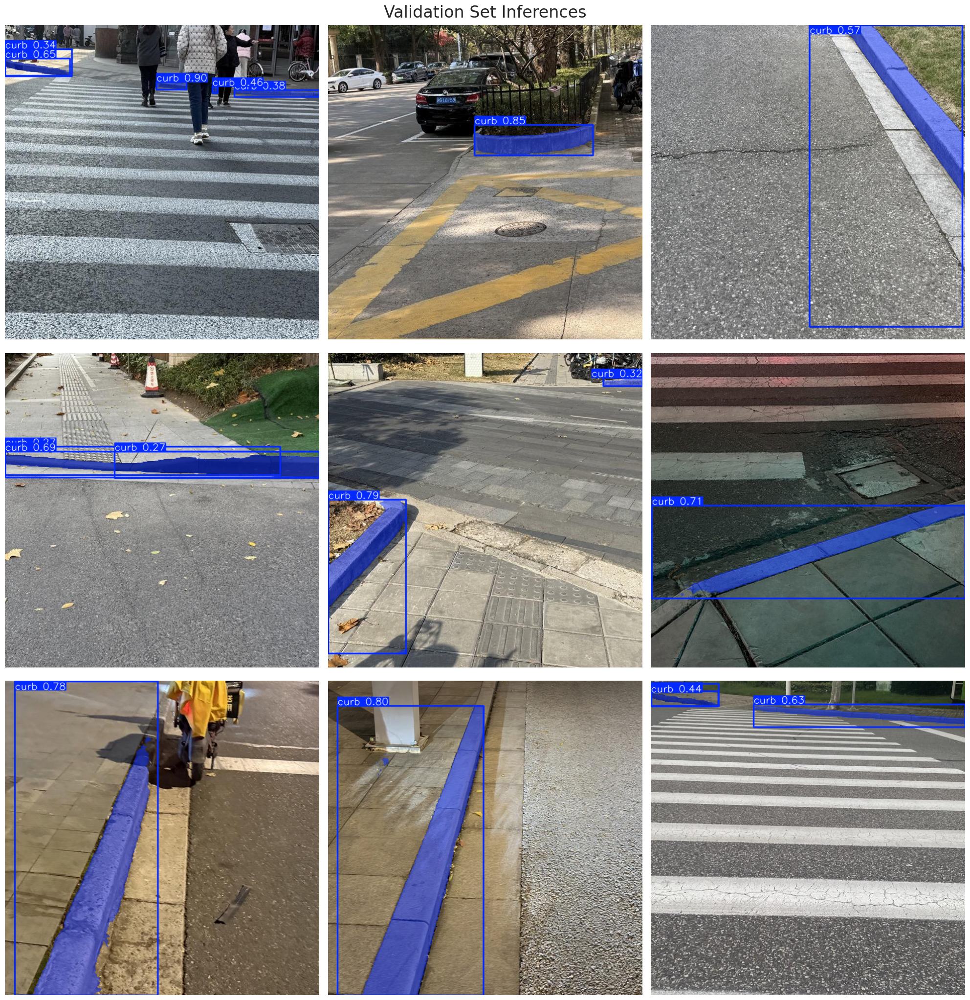

In [28]:
random.seed(2)
# 在验证集中进行推理
# Define the path to the validation images
valid_images_path = os.path.join(dataset_path, 'valid', 'images')

# List all jpg images in the directory
image_files = [file for file in os.listdir(valid_images_path) if file.endswith('.jpg')]

# Select 9 images at equal intervals
num_images = len(image_files)
selected_images = [image_files[i] for i in range(0, num_images, num_images // 9)]

# Initialize the subplot
fig, axes = plt.subplots(3, 3, figsize=(20, 21))
fig.suptitle('Validation Set Inferences', fontsize=24)

# Perform inference on each selected image and display it
for i, ax in enumerate(axes.flatten()):
    image_path = os.path.join(valid_images_path, selected_images[i])
    results = best_model.predict(source=image_path, imgsz=640)
    annotated_image = results[0].plot()
    annotated_image_rgb = cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB)
    ax.imshow(annotated_image_rgb)
    ax.axis('off')

plt.tight_layout()
plt.show()

In [36]:
# 在全新的视频中推理
# Define the destination path in the working directory
video_path = 'autodl-fs/sample_video.mp4'

# Initiate vehicle detection on the sample video using the best performing model and save the output
best_model.predict(source=video_path, save=True)

FileNotFoundError: autodl-fs/sample_video.mp4 does not exist